<a href="https://colab.research.google.com/github/satuelisa/ICN2024/blob/main/S7_applied.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Session 7
## Applied network science

## Epidemic spreading

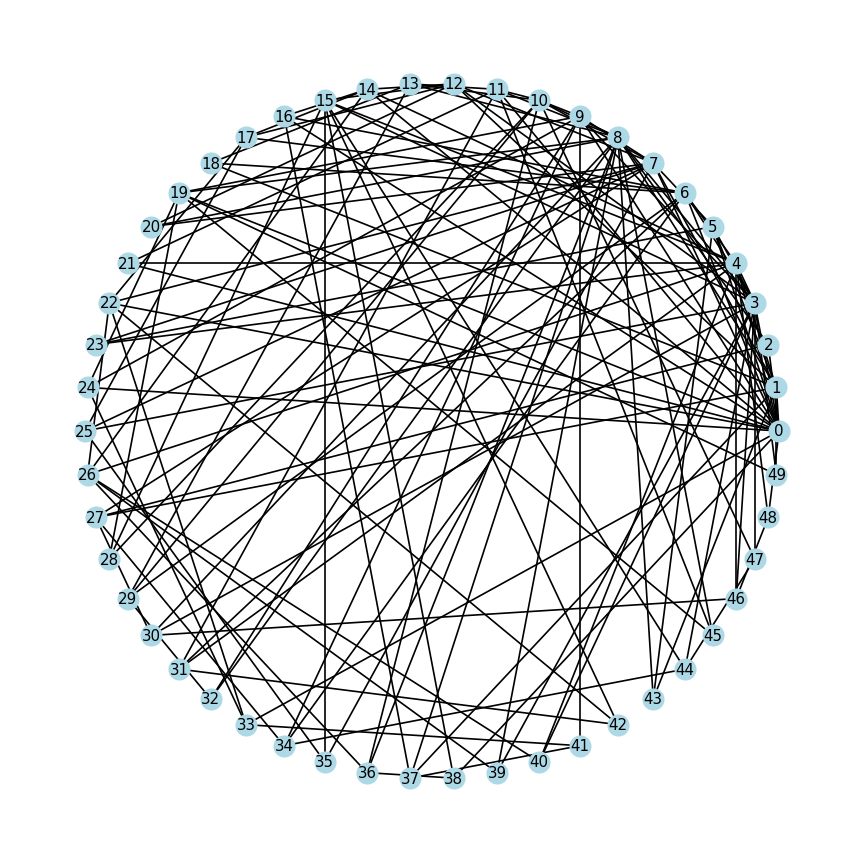

In [1]:
import networkx as nx

n = 50 # how many people (they will arrive one by one)
conn = 3 # how many connections each arriving person forms
G = nx.barabasi_albert_graph(n, conn)
L = nx.circular_layout(G)

import matplotlib.pyplot as plt
fig = plt.figure(1, figsize = (7, 7), dpi =  120)
S = 'lightblue'
nx.draw(G, L, node_color = S, node_size = 150)
l = nx.draw_networkx_labels(G, pos = L, font_size = 9)

In [6]:
from random import sample

perc = 0.07 # what percentage will be initially infected
sickPeople = round(perc * n)
print(n, sickPeople)
infected = sample(list(G.nodes), sickPeople)

50 4


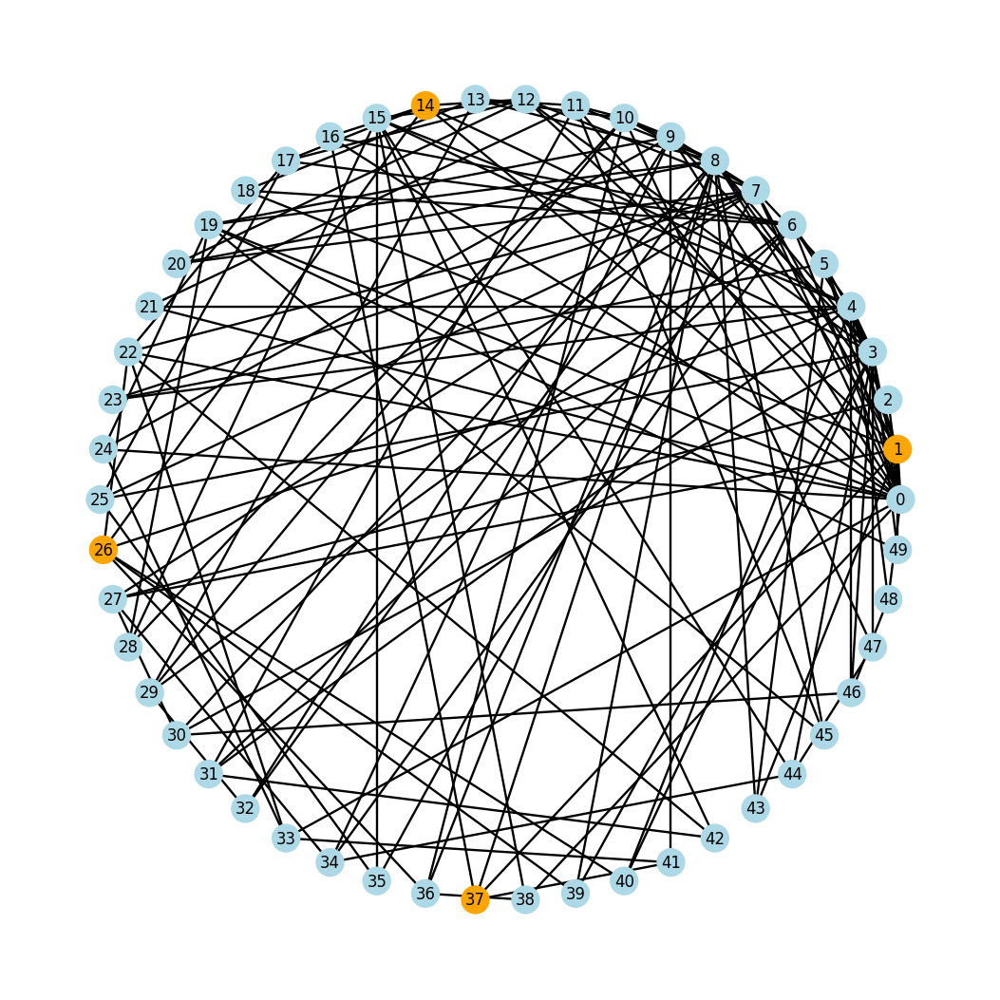

In [8]:
I = 'orange'
state = [ I if v in infected else S for v in G.nodes ]
fig = plt.figure(1, figsize = (6, 6), dpi =  170)
nx.draw(G, L, node_color = state, node_size = 140)
l = nx.draw_networkx_labels(G, pos = L, font_size = 7)

In [9]:
from random import random

def contagions(contagion = 0.15):
  global spread, infected, newlyInfected
  for v in infected:
      for u in G.neighbors(v):
        if u in infected: # already sick
          continue
        if u in recovered: # no re-infection
          continue
        if random() < contagion:
          spread.add((v, u))
          spread.add((u, v))
          newlyInfected.add(u)
  infected.update(newlyInfected)

In [10]:
def recoveries(recovery = 0.1):
  global recovered, infected, newlyInfected
  for v in infected:
    if v not in newlyInfected:
      if random() < recovery:
        recovered.add(v)
  infected -= recovered
  newlyInfected = set()

In [12]:
R = 'purple'

def visualize():
  global G, L, infected, recovered, spread
  Vs = [ I if v in infected else (R if v in recovered else S) for v in G.nodes ]
  Es = [ I if (v, u) in spread else 'black' for v, u in G.edges ]
  nx.draw(G, L, node_color = Vs, edge_color = Es)
  l = nx.draw_networkx_labels(G, pos = L)

In [13]:
def epidemic(t):
  visualize()
  contagions()
  recoveries()

def init(people = 50, contacts = 3, perc = 0.04, show = True):
  global G, L, recovered, spread, infected, newlyInfected
  G = nx.barabasi_albert_graph(people, contacts)
  L = nx.circular_layout(G)
  recovered = set() # nobody yet
  spread = set() # nothing yet
  newlyInfected = set()
  infected = set(sample(list(G.nodes), round(perc * people)))
  if show:
    visualize()

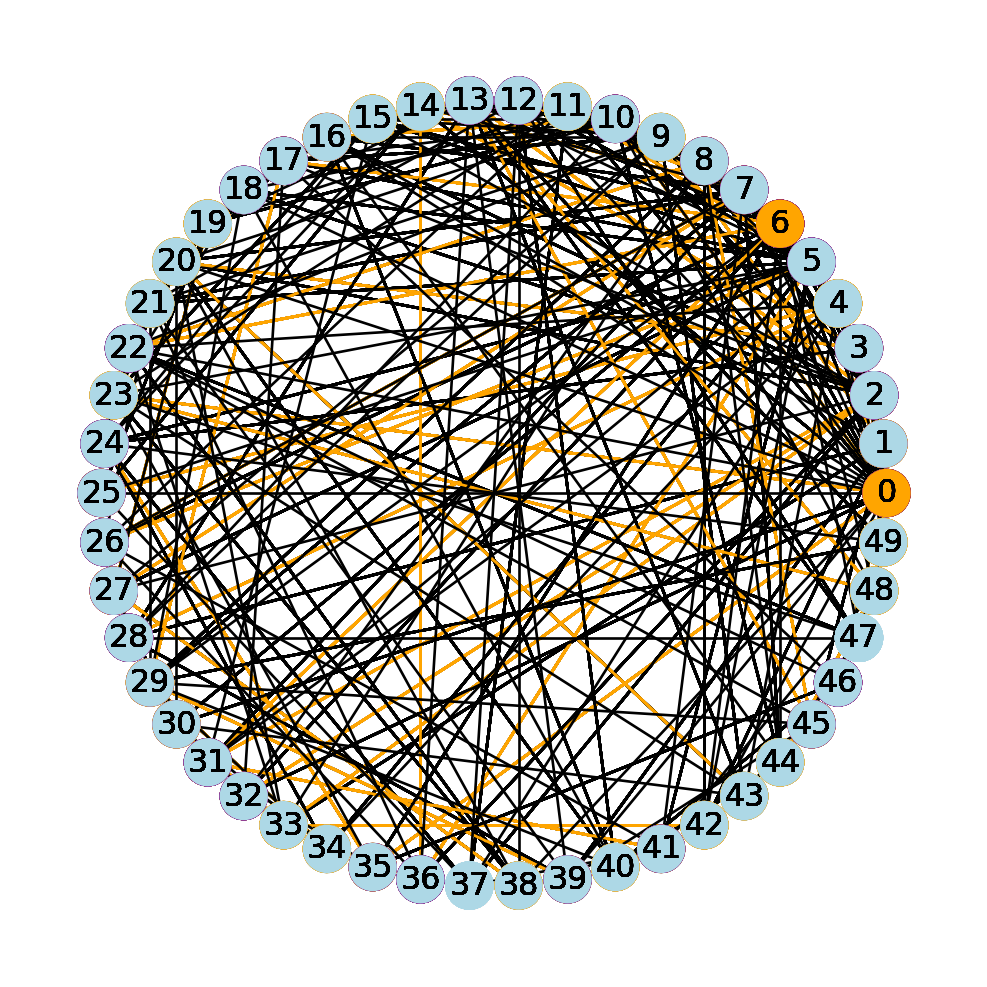

In [14]:
from matplotlib import rc
rc('animation', html = 'jshtml')
import matplotlib.animation as animation

duration = 15
fig = plt.figure(figsize = (5, 5), dpi = 190)
plt.clf()

animation.FuncAnimation(fig, epidemic, frames = duration, repeat = False, init_func = init, interval = 300)

In [17]:
timeseries = { 'S' : [], 'I' : [], 'R' : [] }
n = 2000
init(n, 5, 0.01, show = False)
i = len(infected)
timeseries['I'].append(i)
timeseries['S'].append(n - i)
timeseries['R'].append(0)

permitted = 100
while len(infected) > 0 and permitted > 0:
    contagions(0.15)
    recoveries(0.3)
    i = len(infected)
    r = len(recovered)
    s = n - (i + r) # the rest
    timeseries['S'].append(s)
    timeseries['I'].append(i)
    timeseries['R'].append(r)
    permitted -= 1

for kind in timeseries:
  print(kind, timeseries[kind][:5], timeseries[kind][-5:])

S [1980, 1958, 1867, 1615, 1233] [125, 125, 125, 125, 125]
I [20, 33, 115, 321, 600] [2, 1, 1, 1, 0]
R [0, 9, 18, 64, 167] [1873, 1874, 1874, 1874, 1875]


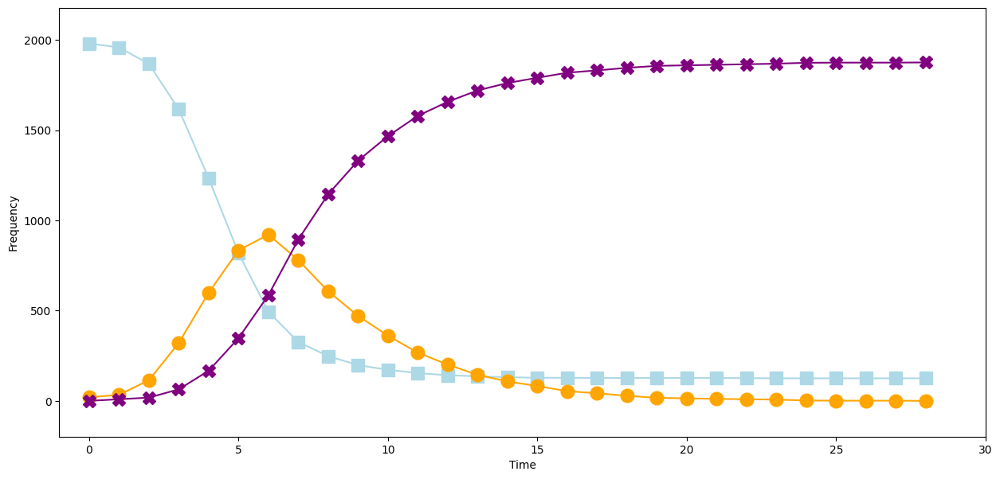

In [18]:
fig = plt.figure(figsize = (15, 7), dpi =  100)
ax = plt.subplot(1, 1, 1)
l = len(timeseries['S'])
plt.xlim(-1, l + 1)
high = max ( [ max(d) for d in timeseries.values() ] )
margin = 0.1 * high
plt.ylim(0 - margin, high + margin)
color = { 'I' : I, 'S' : S, 'R' : R }
marker = { 'I' : 'o', 'S' : 's', 'R' : 'X'}
t = [ i for i in range(l) ]
for kind in timeseries:
    ax.plot(t, timeseries[kind], c = color[kind], marker = marker[kind], ms = 12)
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.show()

## Natural language processing

In [19]:
!pip install gutenbergpy

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.4/300.4 kB 12.0 MB/s eta 0:00:00
  Created wheel for httpsproxy-urllib2: filename=httpsproxy_urllib2-1.0-py3-none-any.whl size=29251 sha256=e6846ef970eb10942708ca2cdbf3fdca513ee6b9f395c4fa4a41c684c6a08a13
  Stored in directory: /root/.cache/pip/wheels/1b/fa/c3/4c14e72101070c40b56c2bfb4617e510e68f121e4f736a5d2a
Successfully built httpsproxy-urllib2


In [20]:
target = 1342 # pride and prejudice
import gutenbergpy.textget
raw = gutenbergpy.textget.get_text_by_id(target) # access the book content
content = gutenbergpy.textget.strip_headers(raw) # remove header metadata
text = content.decode("utf-8") # encoding of the content

In [21]:
marker = 'It is a truth universally acknowledged'
start = text.index(marker)
othermarker = 'had been the means of uniting them.'
end = text.index(othermarker) + len(othermarker)
book = text[start:end]

In [22]:
from string import punctuation
print(punctuation)
removed = book.translate(str.maketrans(punctuation, ' ' * len(punctuation))) # substitute with space

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


In [23]:
import re # regular expressions
from string import printable
print('Allow these:', printable)

Allow these: 0123456789abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~ 	



In [24]:
forbid = f'[^{re.escape(printable)}]' # everything else must go
ok = re.sub(forbid, ' ', removed)
clean = re.compile(r'\s+')
cleaner = clean.sub(' ', ok) # remove repeated spaces

In [25]:
words = cleaner.split() # break it into individual words

def keep(word):
  if len(word) < 2: # keep I and A
    return True
  return not word.isupper()

good = list(filter(keep, words))

In [26]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
sw = stopwords.words('english')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [27]:
def keepAgain(w):
  return not (w.lower() in sw) and not (w.isdigit()) and len(w) > 2

better = list(filter(keepAgain, good))

In [28]:
distinct = set(better)

def singularize(word):
  lc = word.lower()
  if lc in distinct:
    word = lc
  if word[-1] == 's': # ends in 's'
    cropped = word[:-1]
    if cropped in distinct:
      return cropped
  return word

In [29]:
simple = [ singularize(w) for w in better ]

In [30]:
import networkx as nx

middle = len(simple) // 2
length = 100

graph = nx.DiGraph() # for directed edges
sequence = simple.copy()[ (middle - length) : (middle + length) ] # just a fragment

In [31]:
currentWord = sequence.pop(0)
while len(sequence) > 0:
  followingWord = sequence.pop(0)
  if graph.has_edge(currentWord, followingWord):
    graph[currentWord][followingWord]['weight'] += 1
  else:
    graph.add_edge(currentWord, followingWord, weight = 1)
  currentWord = followingWord

In [32]:
pos = nx.spring_layout(graph) # calculate positions (this takes a long time)

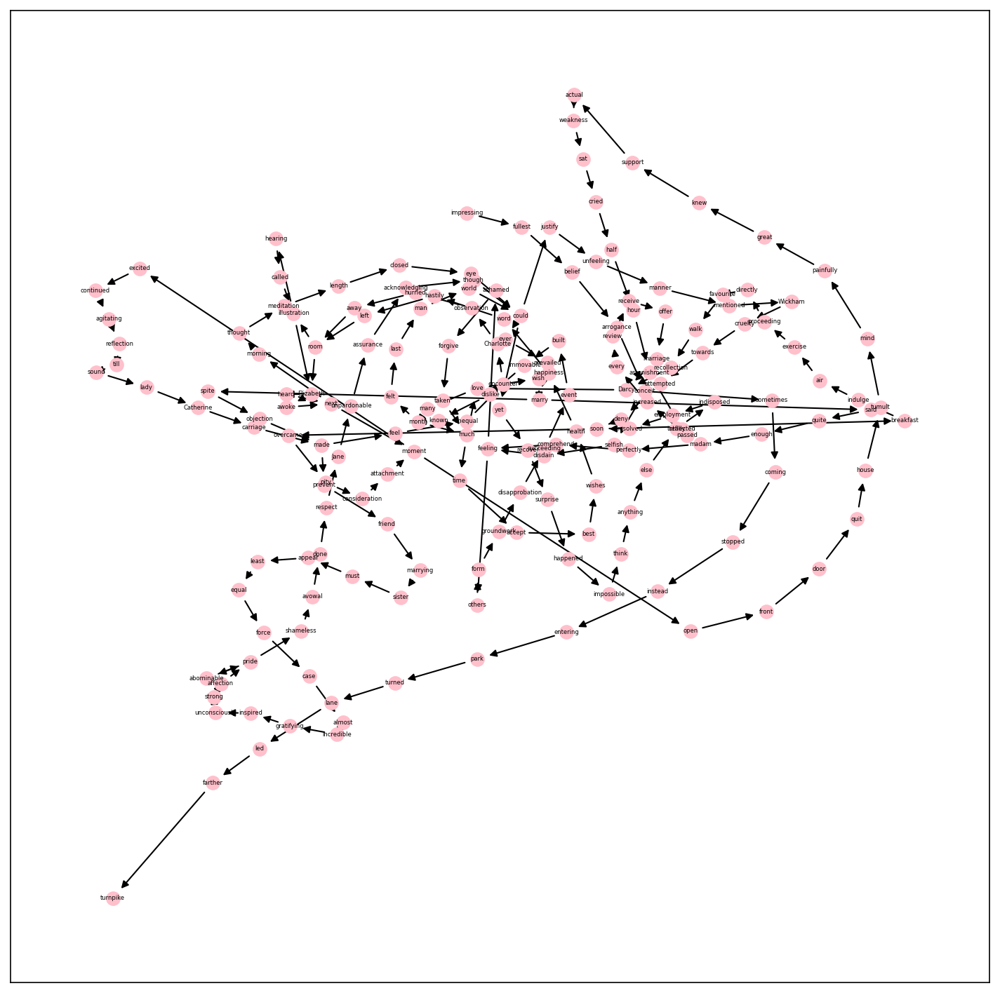

In [33]:
import matplotlib.pyplot as plt
fig = plt.figure(1, figsize = (12, 12), dpi =  150)
V = nx.draw_networkx_nodes(graph, pos, node_size = 80, node_color = 'pink')

w = [ graph[u][v]['weight'] for u, v in graph.edges ]
E = nx.draw_networkx_edges(graph, pos, width = w)
vl = nx.draw_networkx_labels(graph, pos, font_size = 4)

In [34]:
g = nx.Graph()
whole = simple.copy()
currentWord = whole.pop(0)
while len(whole) > 0:
  followingWord = whole.pop(0)
  if g.has_edge(currentWord, followingWord):
    g[currentWord][followingWord]['weight'] += 1
  else:
    g.add_edge(currentWord, followingWord, weight = 1)
  currentWord = followingWord

In [35]:
ditch = []
threshold = 5
for e in g.edges():
  (s, t) = e
  if g[s][t]['weight'] < threshold:
    ditch.append(e)

g.remove_edges_from(ditch)
floaters = list(nx.isolates(g))
g.remove_nodes_from(floaters)

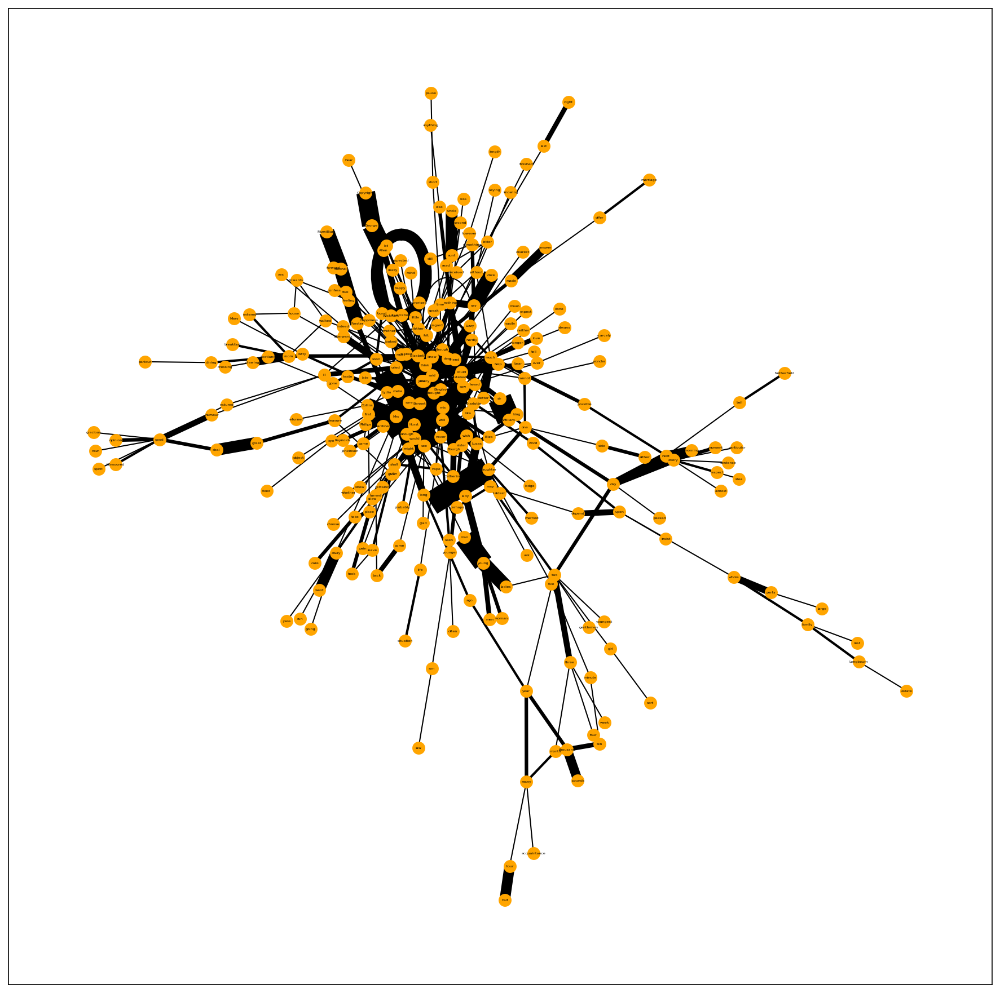

In [36]:
lcc = g.subgraph(max(nx.connected_components(g), key=len))

fig = plt.figure(1, figsize = (15, 15), dpi =  150)
p2 = nx.spring_layout(lcc)
V = nx.draw_networkx_nodes(lcc, p2, node_size = 100, node_color = 'orange')

w = [ (lcc[u][v]['weight'] - threshold) // 2 + 1 for u, v in lcc.edges ]

E = nx.draw_networkx_edges(lcc, p2, width = w)
vl = nx.draw_networkx_labels(lcc, p2, font_size = 3)